In [1]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os

from rasterio.errors import RasterioIOError
from cuml.ensemble import RandomForestClassifier as cuRF
import csv
import sys
if '/mnt/c/Users/attic/HLS Kelp Detection/tools' not in sys.path:
    sys.path.append('/mnt/c/Users/attic/HLS Kelp Detection/tools')
import kelp_tools_linux as kt
import data_tools as dt
import cupy as cp
import time 
import cudf
import pickle

In [2]:
tile = '10UCU'
location = 'Isla_vista_kelp'
cloud_cover_threshold = .25
save_mask = True
save_classification = True
path = '/mnt/c/Users/attic/HLS Kelp Detection/imagery/tiles'
#path = r'C:\Users\attic\HLS_Kelp\imagery\Isla_vista_kelp_2018\11SKU'
items =['HLS.S30.T10UCU.2020149T191909.v2.0',
    'HLS.S30.T10UCU.2020251T190931.v2.0',
    'HLS.L30.T10UCU.2023129T191326.v2.0',
    'HLS.S30.T10UCU.2020254T192001.v2.0',
    'HLS.S30.T10UCU.2018196T190909.v2.0',
    'HLS.S30.T10UCU.2021168T191911.v2.0',
    'HLS.L30.T10UCU.2018043T191337.v2.0']
save_to = '/mnt/c/Users/attic/HLS Kelp Detection/random_forest/training_data/unclassified'
show_dem = True

rf_model = 'cu_rf9'
rf_path = os.path.join(r'/mnt/c/Users/attic/HLS Kelp Detection/random_forest',rf_model)

In [3]:
def reduce_cudf_zero(df):
    arr = df.to_cupy()
    non_zero_mask = cp.any(arr != 0, axis=1)
    reduced_df = df[non_zero_mask]
    original_indices = cp.arange(arr.shape[0])
    filtered_indices = original_indices[non_zero_mask]
    return reduced_df, filtered_indices, original_indices

def revert_cudf_zero(reduced_df, filtered_indices, original_indices):
    full_df = cudf.Series(cp.full(len(original_indices), 3))
    full_df.iloc[filtered_indices] = reduced_df
    
    return full_df

In [4]:
with open(rf_path, 'rb') as f:
    cu_rf = pickle.load(f)

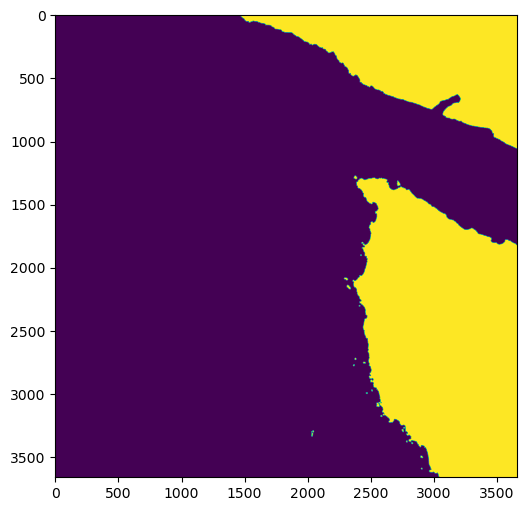

2020-05-28T19:31:15.320657Z
['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-public/HLSS30.020/HLS.S30.T10UCU.2020149T191909.v2.0/HLS.S30.T10UCU.2020149T191909.v2.0.jpg']


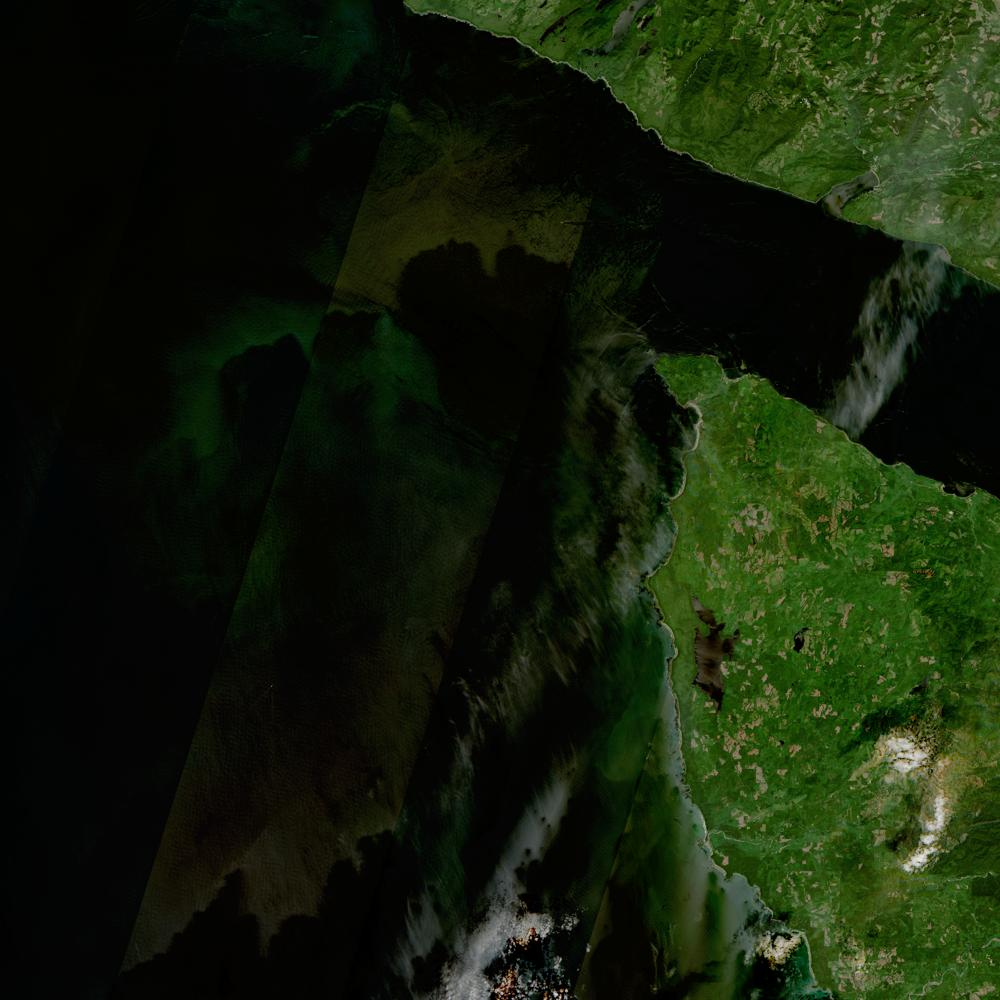

RF finished. Duration:2.6562769412994385 seconds


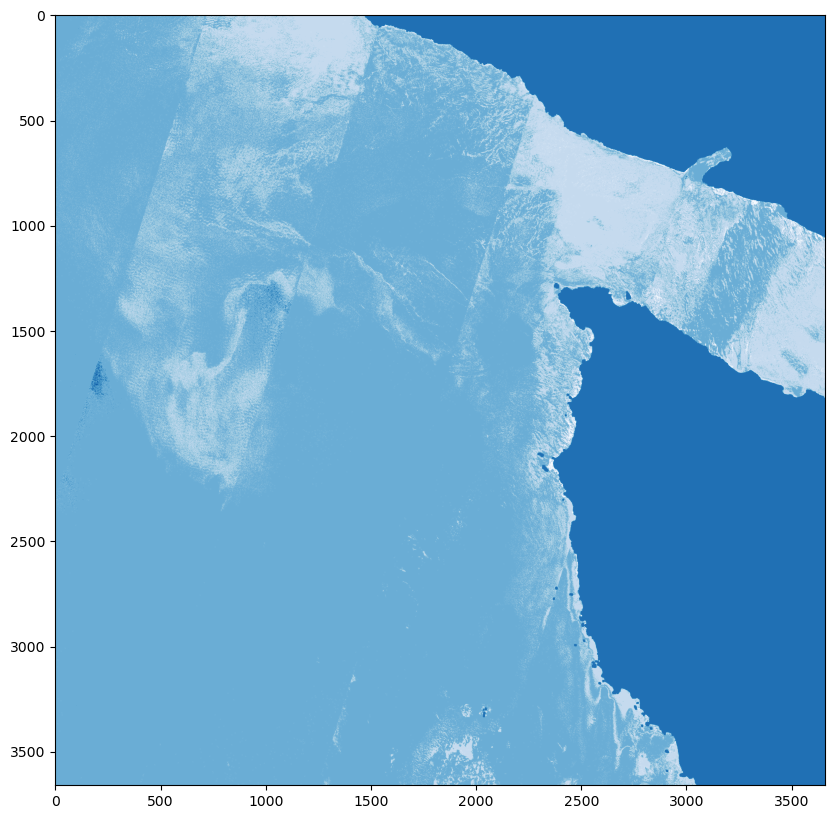

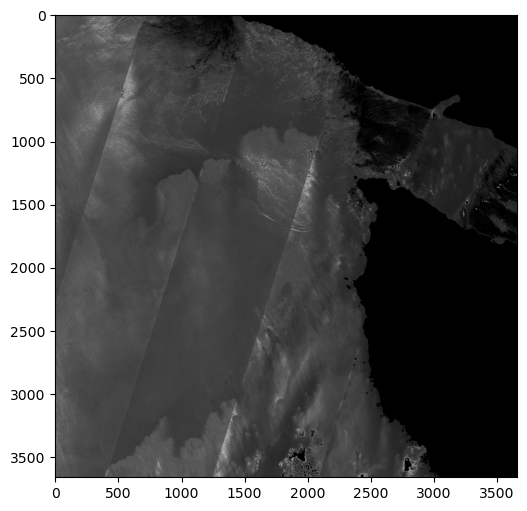

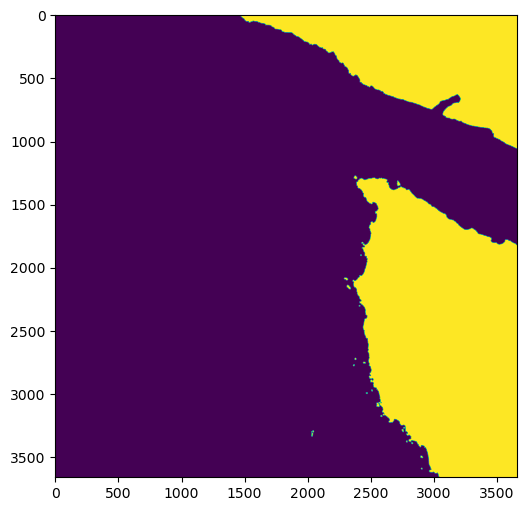

2020-09-07T19:21:21.010702Z
['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-public/HLSS30.020/HLS.S30.T10UCU.2020251T190931.v2.0/HLS.S30.T10UCU.2020251T190931.v2.0.jpg']


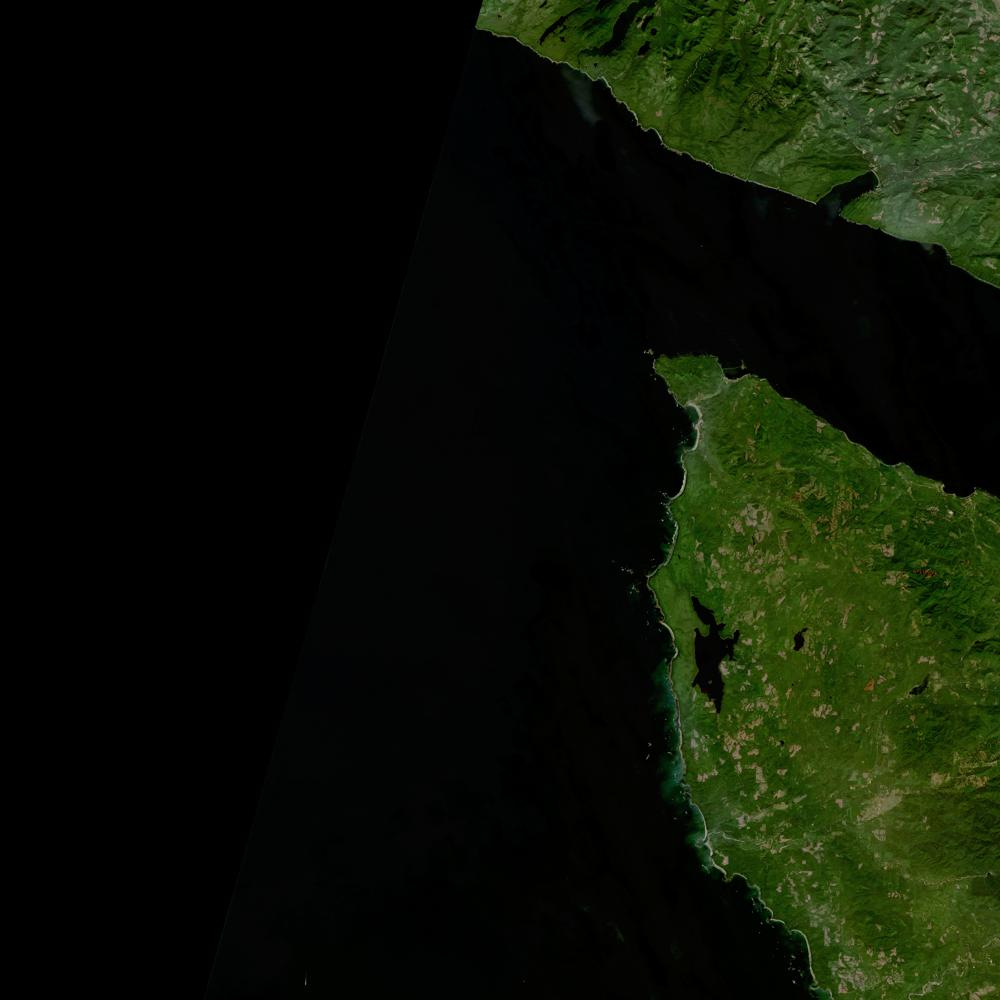

RF finished. Duration:2.317866563796997 seconds


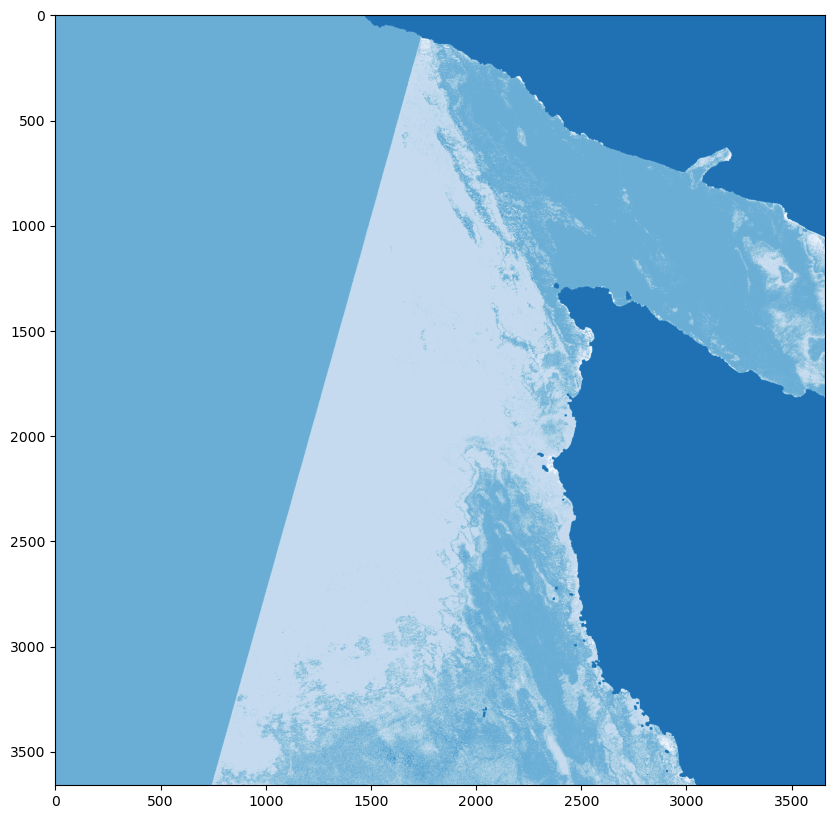

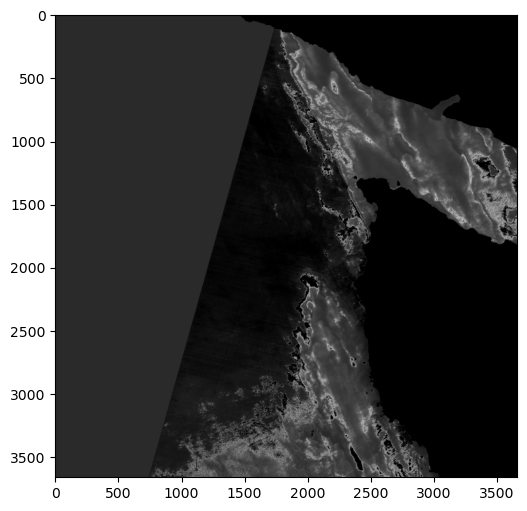

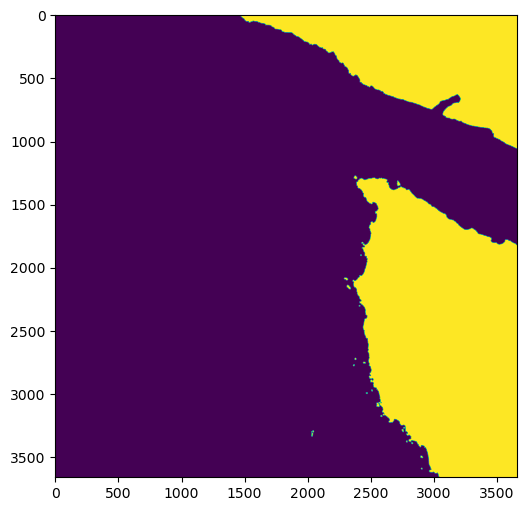

2023-05-09T19:13:26.8052300Z
['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-public/HLSL30.020/HLS.L30.T10UCU.2023129T191326.v2.0/HLS.L30.T10UCU.2023129T191326.v2.0.jpg']


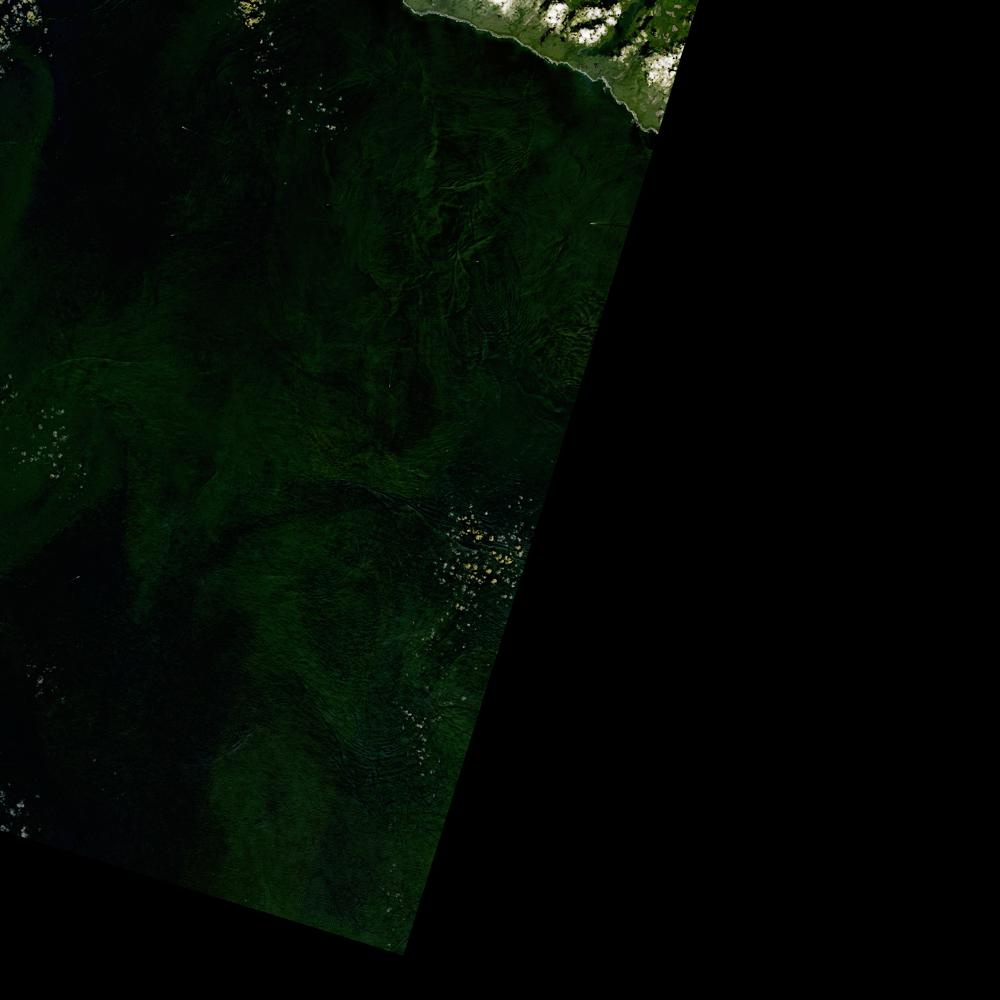

RF finished. Duration:2.754934072494507 seconds


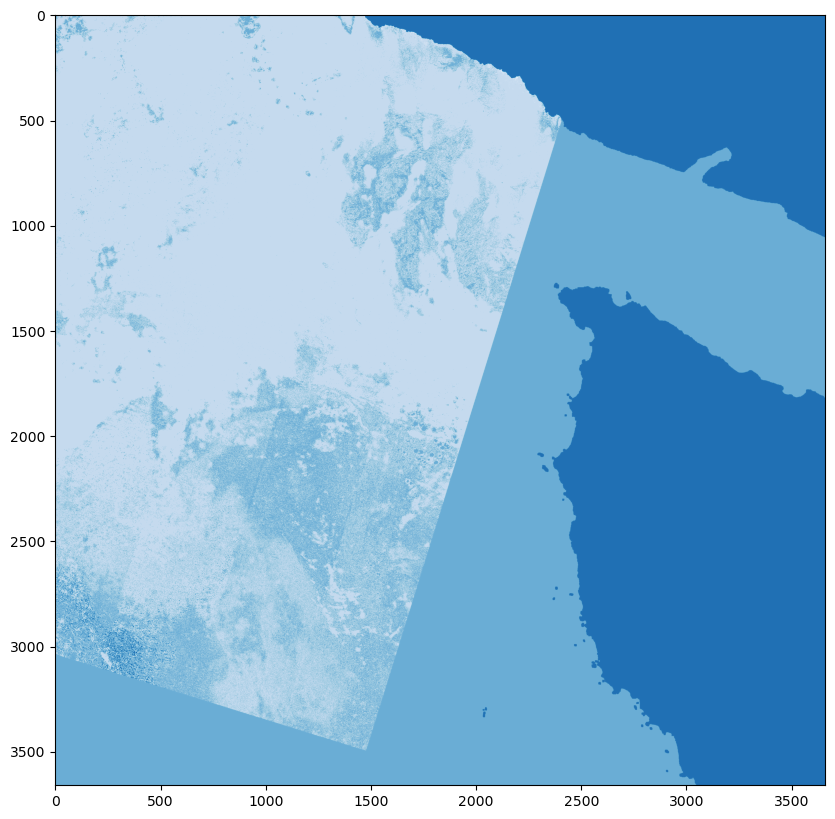

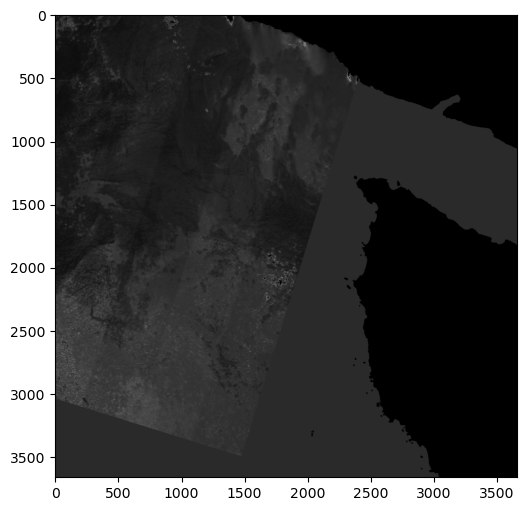

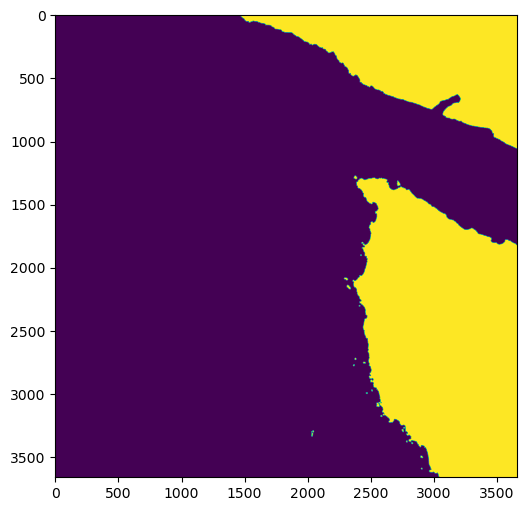

2020-09-10T19:31:17.752369Z
['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-public/HLSS30.020/HLS.S30.T10UCU.2020254T192001.v2.0/HLS.S30.T10UCU.2020254T192001.v2.0.jpg']


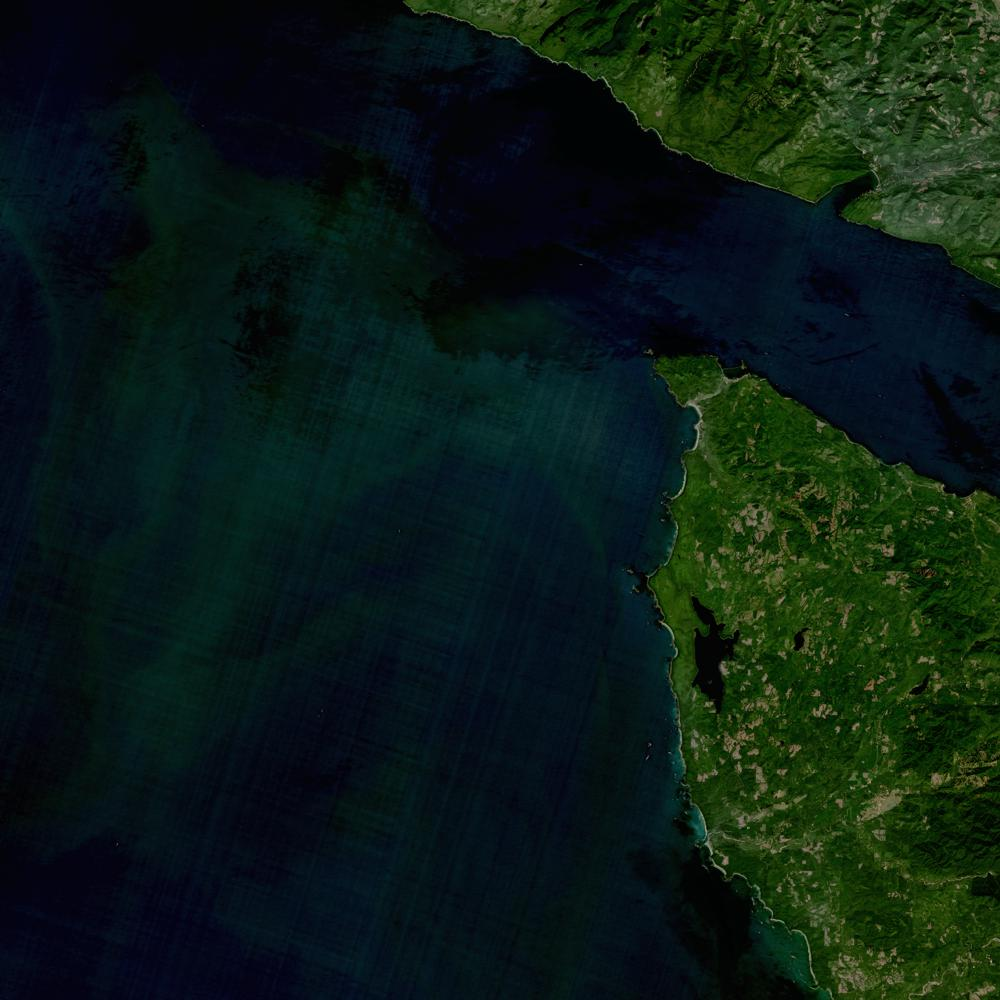

RF finished. Duration:1.881861925125122 seconds


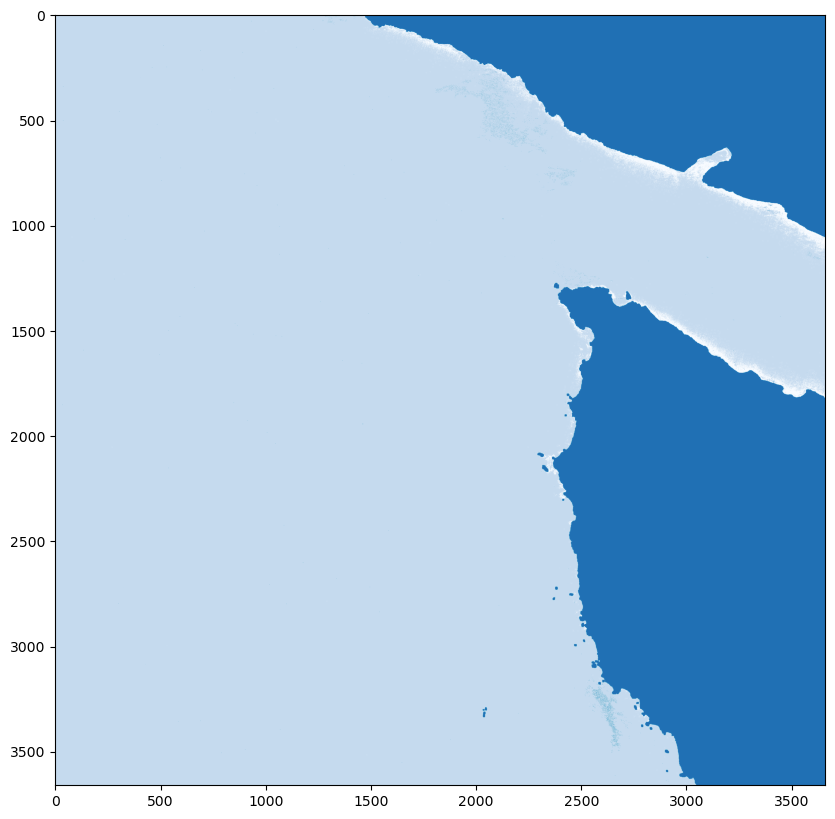

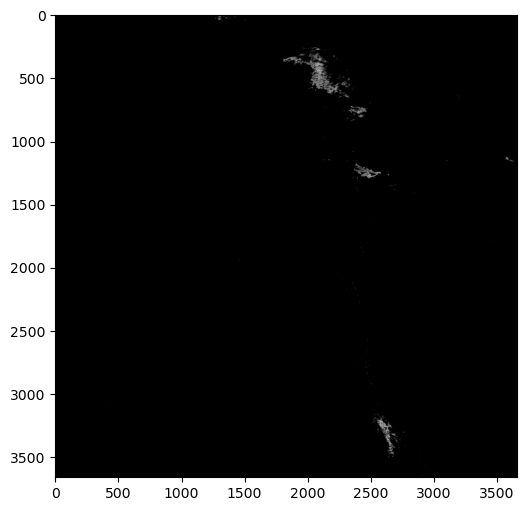

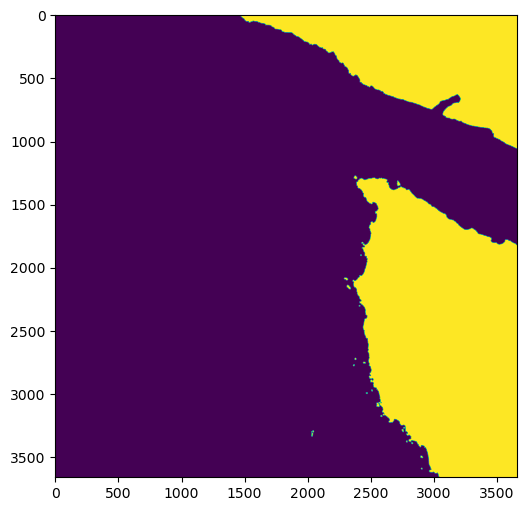

2018-07-15T19:14:28.946Z
['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-public/HLSS30.020/HLS.S30.T10UCU.2018196T190909.v2.0/HLS.S30.T10UCU.2018196T190909.v2.0.jpg']


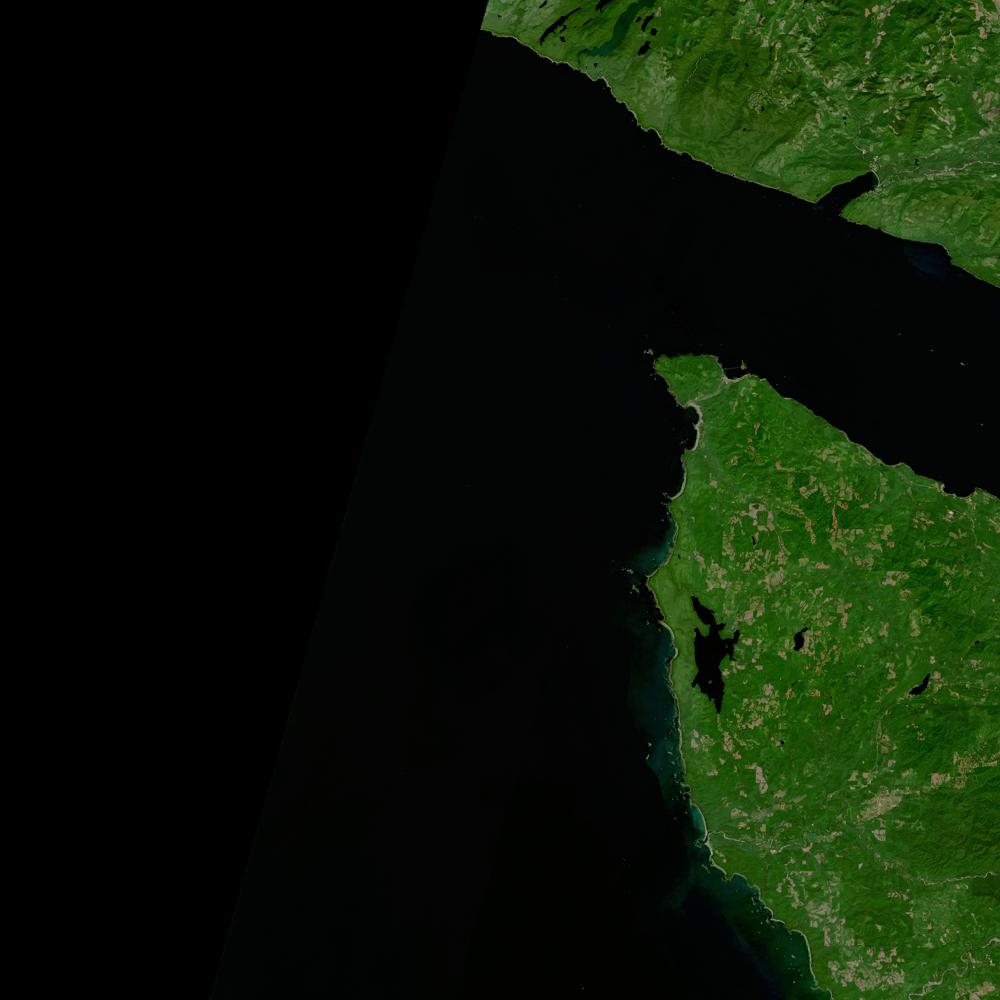

RF finished. Duration:2.975937604904175 seconds


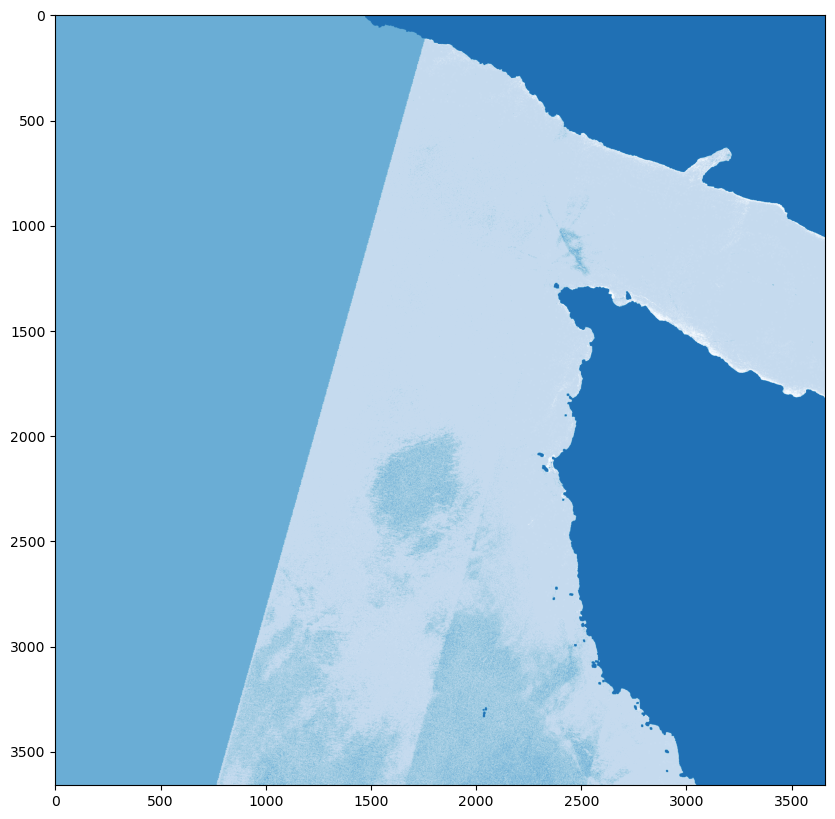

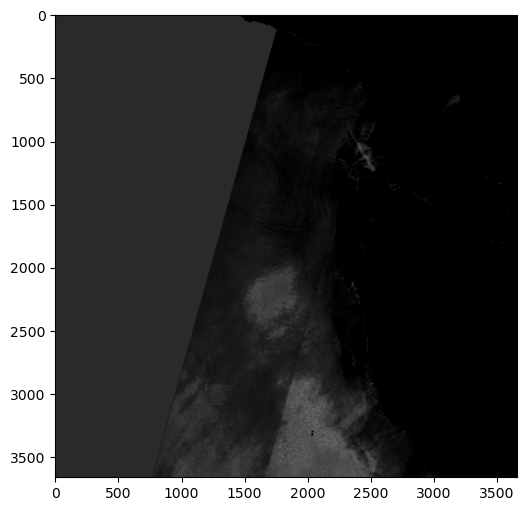

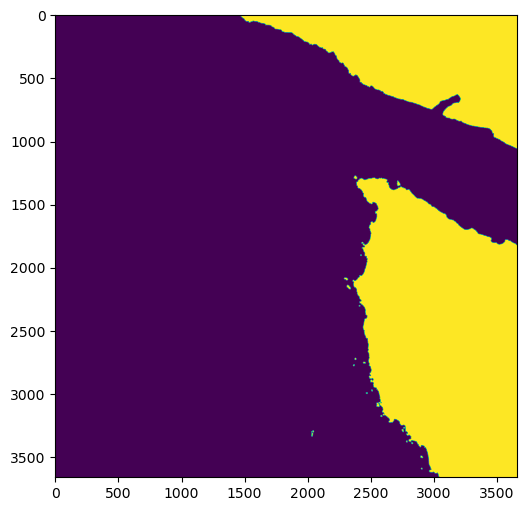

2021-06-17T19:31:14.244762Z
['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-public/HLSS30.020/HLS.S30.T10UCU.2021168T191911.v2.0/HLS.S30.T10UCU.2021168T191911.v2.0.jpg']


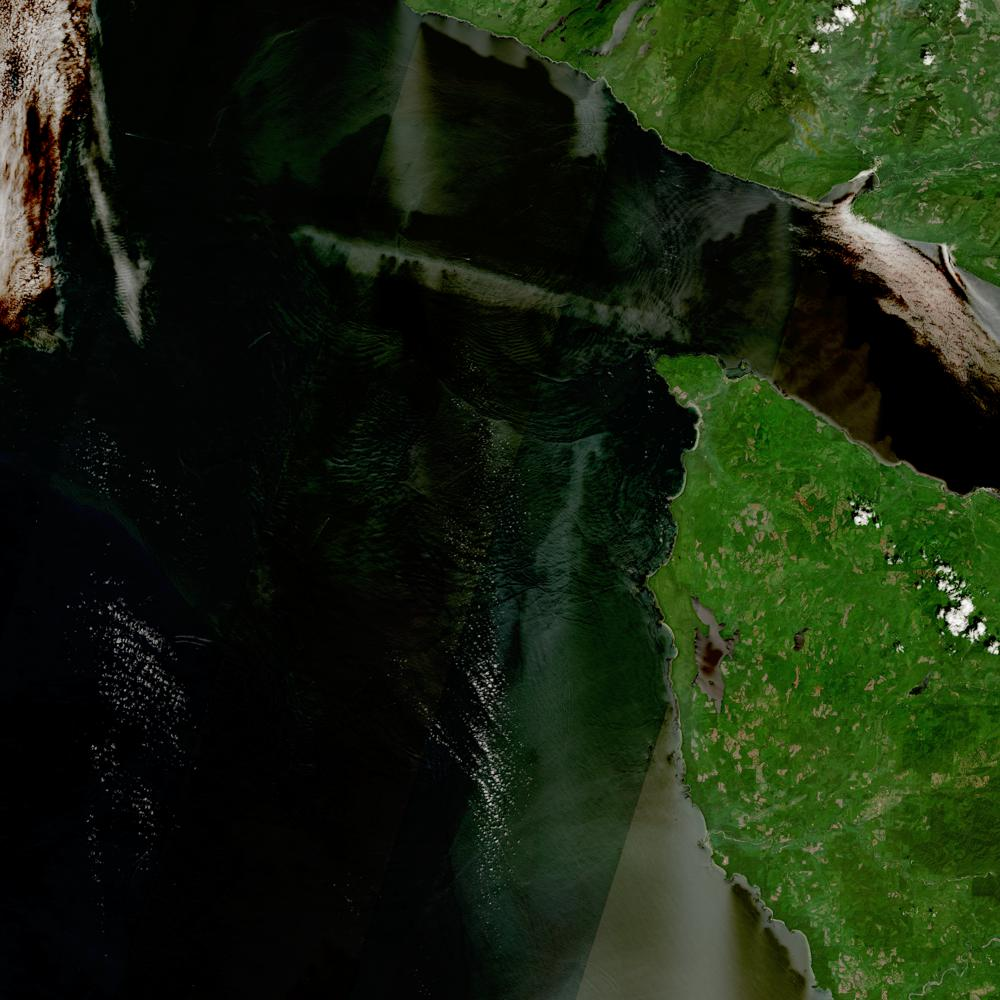

RF finished. Duration:4.011887311935425 seconds


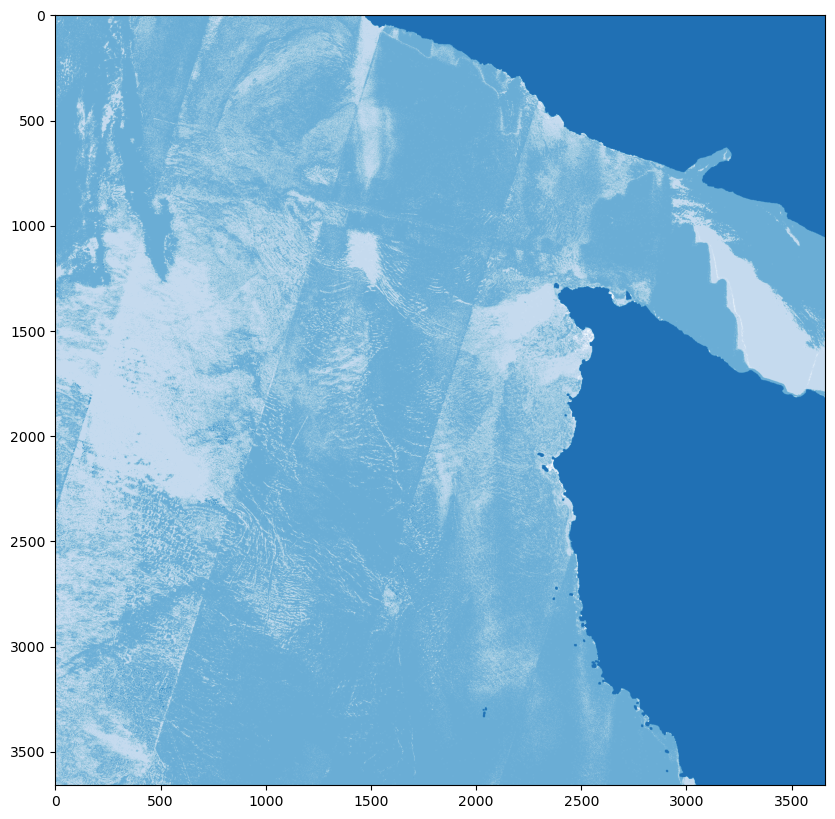

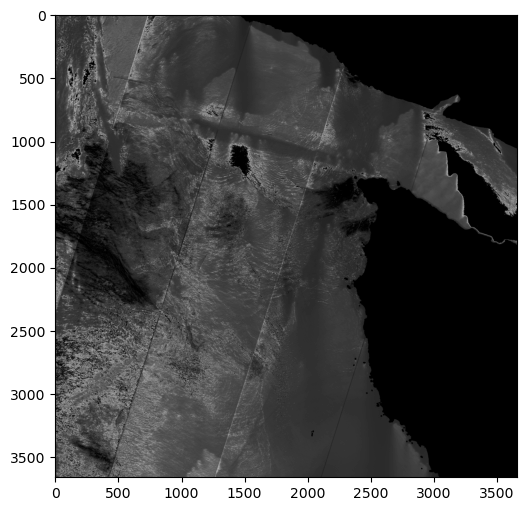

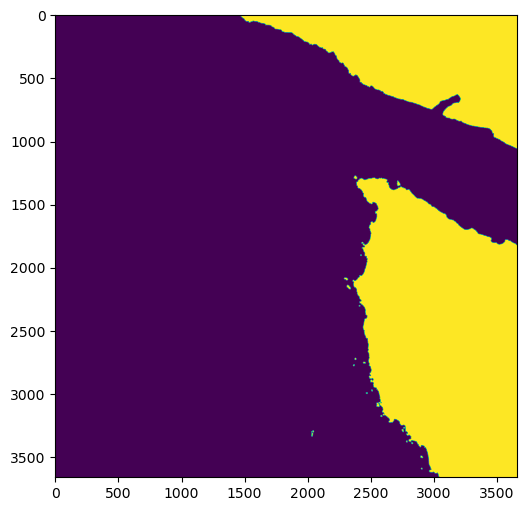

2018-02-12T19:13:37.0537790Z
['https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-public/HLSL30.020/HLS.L30.T10UCU.2018043T191337.v2.0/HLS.L30.T10UCU.2018043T191337.v2.0.jpg']


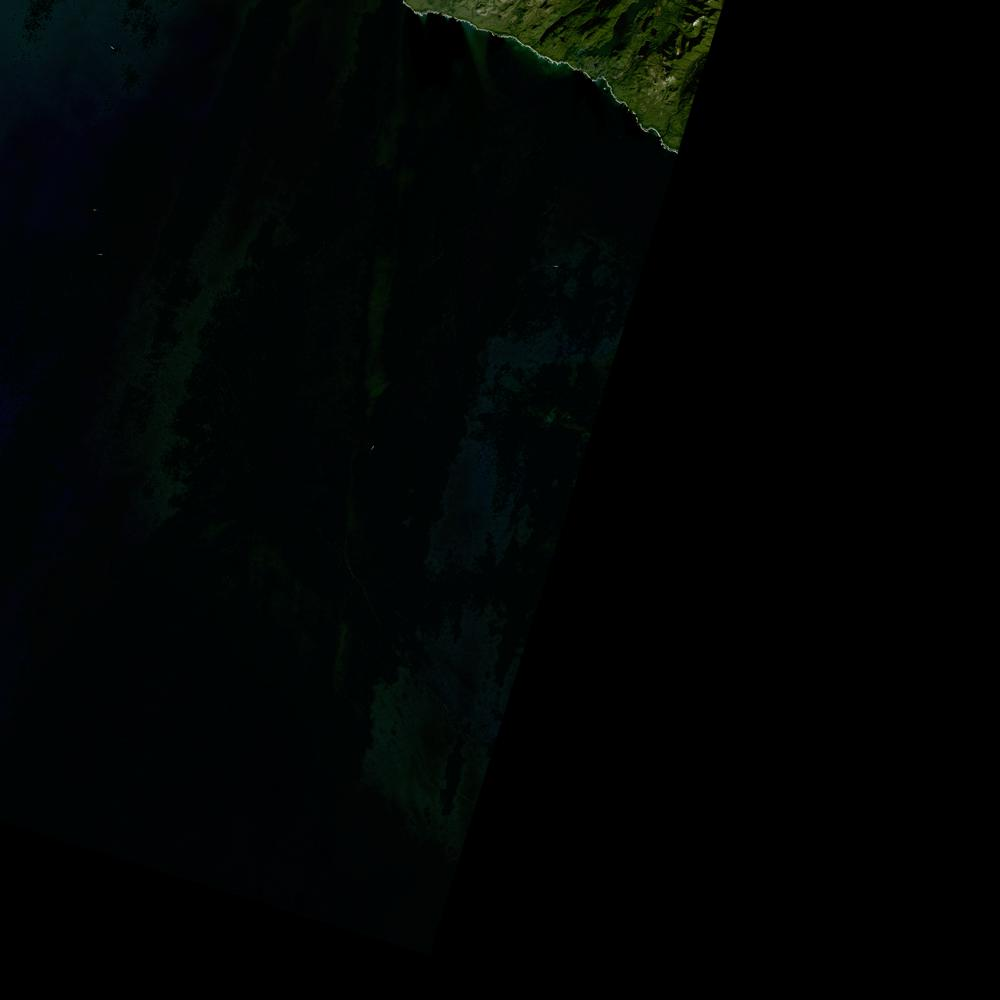

RF finished. Duration:3.322713613510132 seconds


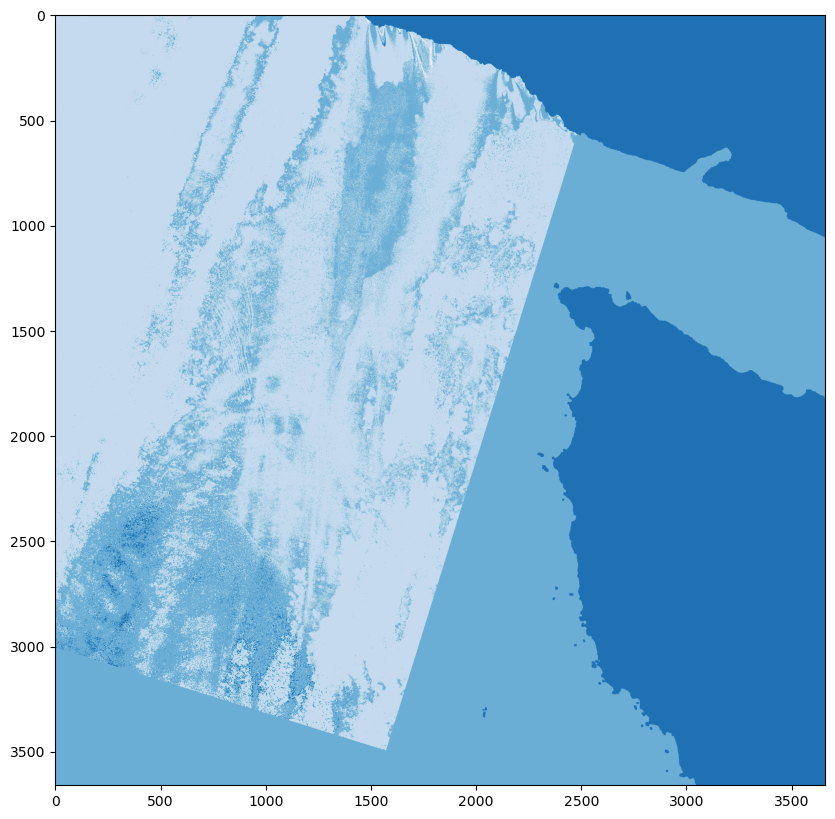

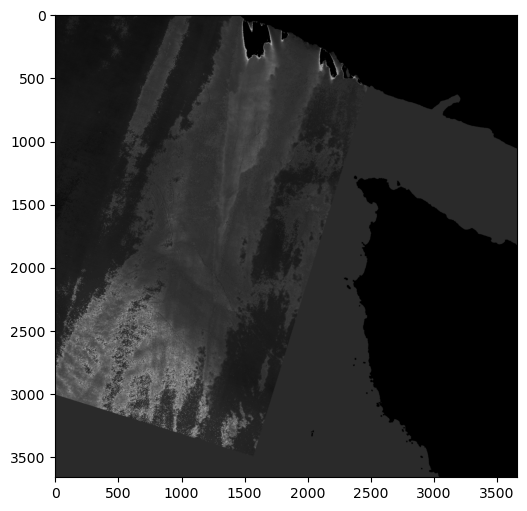

In [9]:
for item in items:
    tile_path = os.path.join(path,tile)
    img_path = os.path.join(path,tile, item)

    dem_path = os.path.join(path,tile,'dem')
    img_files = kt.filter_and_sort_files(img_path,item)

    geotiff_path = os.path.join(img_path, img_files[0])

    land_mask = kt.create_land_mask(hls_path=geotiff_path, dem_path=dem_path, show_image=show_dem, as_numpy=False)

    dt.view_img(img_path)


    ##==========Create stacked np array, Apply landmask==========##
    img_bands = []
    crs = None
    transform = None
    try:
        for file in img_files:
            with rasterio.open(os.path.join(img_path, file)) as src:
                band = cp.asarray(src.read(1))
                img_bands.append(cp.where(land_mask, 0, band))

                if(transform is None):
                    transform = src.transform
                    crs= src.crs
    except RasterioIOError as e:
        print(f"Error reading file {file} in granule {item}: {e}")
        sys.exit()

    img = cp.stack(img_bands, axis=0)
    
    del img_bands
    n_bands, height, width = img.shape

    img_2D_normalized = kt.normalize_img(img, flatten=False)
    img_data = cudf.DataFrame(img_2D_normalized).astype(np.float32)
     

    
    pred_time = time.time()

    reduced_img_data, filtered_indices, original_indices = kt.reduce_cudf_zero(img_data)

    del img_data
    kelp_pred_shrunk= cu_rf.predict(reduced_img_data).astype(cp.float32)

    kelp_pred = kt.revert_cudf_zero(kelp_pred_shrunk.astype(cp.uint8), filtered_indices, original_indices)

    #kelp_pred_cp = cp.asarray(kelp_pred)
    #kelp_pred = cp.where(cp.isnan(kelp_pred_cp), 3, kelp_pred)
    del reduced_img_data, filtered_indices,original_indices
    print(f'RF finished. Duration:{time.time()-pred_time} seconds')
    classified_img = kelp_pred.values_host.reshape(width, height)
    plt.figure(figsize=(20, 10))
    plt.imshow(np.array(classified_img), cmap='Blues')
    plt.show()
    img_normalized= img_2D_normalized.T.reshape(img.shape[0],img.shape[1],img.shape[2])
    img_normalized= cp.moveaxis(img_normalized, 0, -1)
    if save_classification:
        if not os.path.isdir (save_to):
            os.mkdir(save_to)
        classification_path = os.path.join(save_to,f'{item}_unclassified.tif') 
        height, width = classified_img.shape
        reshaped_normalized_img = cp.asnumpy(img_normalized)
        combined_img = np.dstack((reshaped_normalized_img,classified_img))

        plt.figure(figsize=(6, 6))
        plt.imshow(combined_img[:,:,4], cmap='gray')
        plt.show()  

        num_bands = 7
        data_type = rasterio.uint8
        profile = {
            'driver': 'GTiff',
            'width': width,
            'height': height,
            'count': 7,  # one band
            'dtype': data_type,  # assuming binary mask, adjust dtype if needed
            'crs': crs,
            'transform': transform,
            'nodata': 0  # assuming no data is 0
        }
        # Write the land mask array to GeoTIFF
        with rasterio.open(classification_path, 'w', **profile) as dst:
            for i in range(num_bands):
                dst.write(combined_img[:,:,i].astype(data_type), i + 1)